# View altitude shift

In [34]:
import sys

# Add the project PATH
PATH = "/mnt/Storage/Projects/CosmicDance"
sys.path.append(PATH)

In [35]:
from cosmic_dance.dst_index import *
from cosmic_dance.io import *
from cosmic_dance.stack_plots import *
from cosmic_dance.TLEs import *

## Absolute altitude change in quiet days (< 80 nT)

In [36]:
def plot_altitude_variations(filename: str, title: str):
    
    df_event = pd.read_csv(filename)

    # Params
    plt.figure(figsize=(15, 4))
    plt.rcParams.update({'font.size': 15})

    # Plot each satellites
    for cat_id in df_event["CAT_ID"].unique():
        df = df_event[df_event["CAT_ID"] == cat_id]

        plt.plot(
            df["DAYS"],  df["ALTITUDE_CHANGE_KM"],
            # color='lightblue',
            color='gray',
            linestyle='dotted',
            alpha=0.9
        )

    # statistical- overall tendency
    day_wise_median = []
    day_wise_ptile_95 = []
    vartical_line = {}

    for day in df_event["DAYS"].unique():
        df = df_event[df_event["DAYS"] == day]
        day_wise_median.append(df["ALTITUDE_CHANGE_KM"].median())
        day_wise_ptile_95.append(percentile(df["ALTITUDE_CHANGE_KM"], 95))
        vartical_line[day] = 0 if 67 >df["nT"].max() else df["nT"].max()

    # Relative (to 0-th day) intensity markers
    width_list = sorted(set(vartical_line.values()))
    # print(width_list)
    for v in vartical_line.keys():
        plt.axvline(
            x=v,
            color='r',
            linestyle='-',
            linewidth=width_list.index(vartical_line[v]),
            alpha=0.1
        )

    # Overall tendency
    plt.plot(
        [i for i in range(len(day_wise_median))],  day_wise_median,
        c='b',
        linewidth=5,
        linestyle='dashed',
        label='Day wise median change'
    )

    plt.plot(
        [i for i in range(len(day_wise_ptile_95))],  day_wise_ptile_95,
        c='g',
        linewidth=5,
        label='Day wise 95%tile change'
    )

    # Scaling and marking
    plt.xlabel('Days')
    plt.ylabel('Absolute altitude change (km)')
    plt.xticks(df_event["DAYS"].unique().sort())
    plt.ylim(0, 10)
    # plt.title(title)
    plt.grid(True)
    plt.legend(
        loc='best'
        # ,bbox_to_anchor=(1, 1)
    )
    plt.tight_layout()
    plt.show()

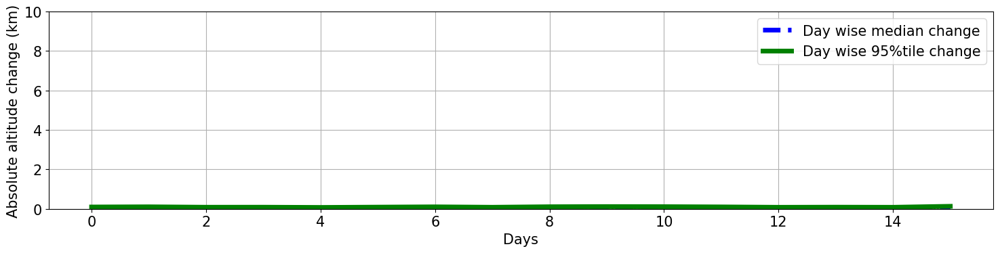

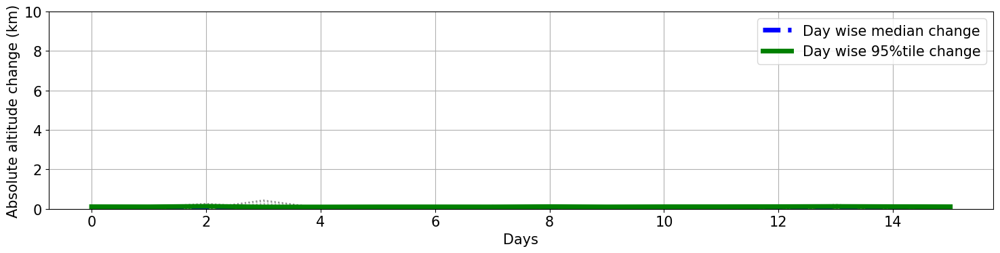

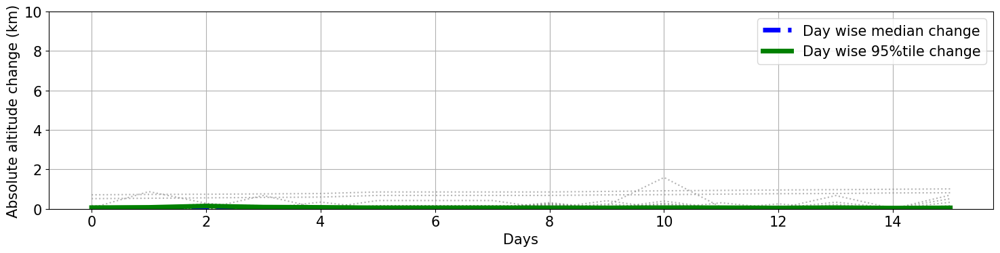

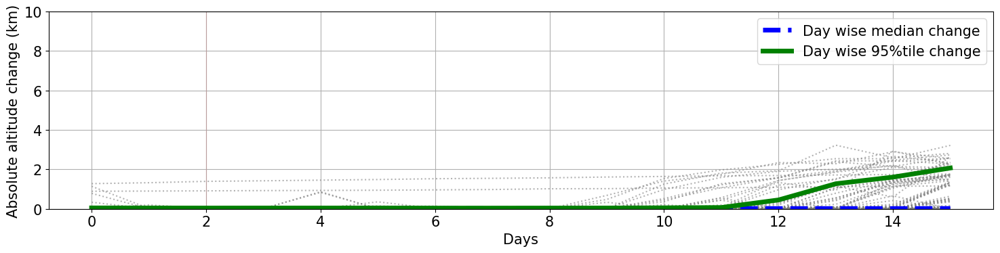

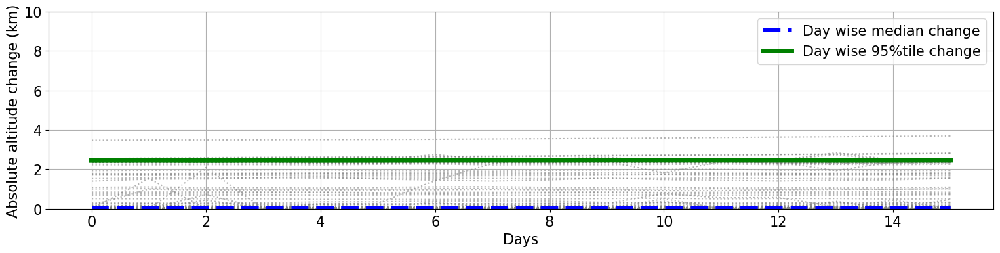

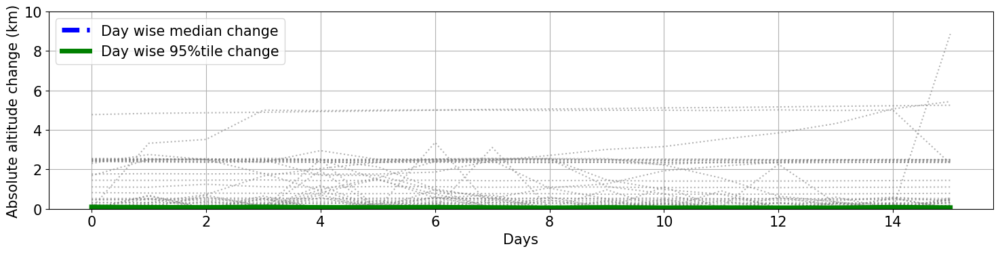

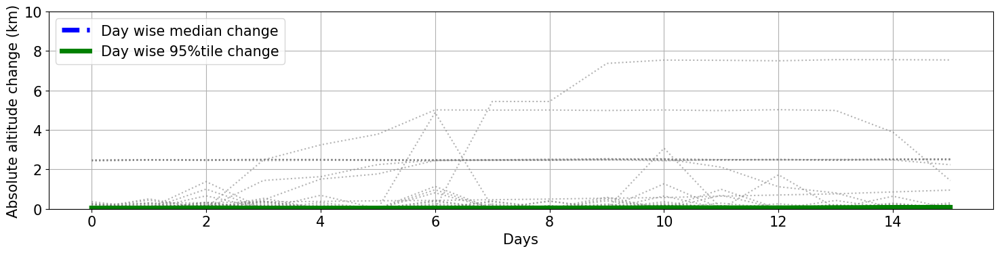

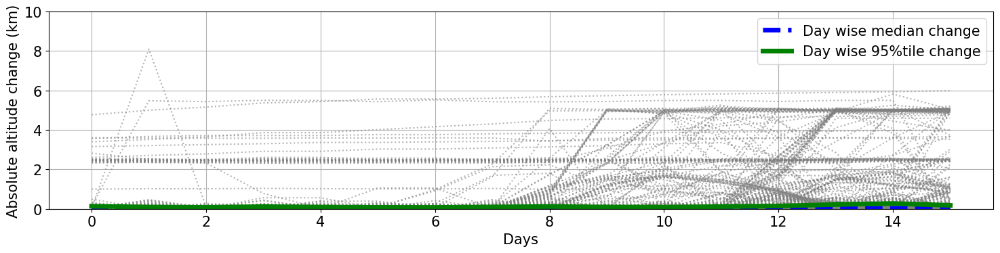

In [ ]:
NORMAL_DAY_DIR = "../../artifacts/OUTPUT/Starlink/measurement/track_altitude_change/quiet_day"

for file in sorted(os.listdir(NORMAL_DAY_DIR)):
    plot_altitude_variations(
        f"{NORMAL_DAY_DIR}/{file}",
        file.split(".")[0]
    )

## Absolute altitude change after high intensity days

In [32]:
MINOR_NO_IMPACT = "../../artifacts/OUTPUT/Starlink/measurement/track_altitude_change/merged_above_ptile_99/minor_no_impact"
STATION_KEEPING = "../../artifacts/OUTPUT/Starlink/measurement/track_altitude_change/merged_above_ptile_99/station_keeping"
PERMANENT_DECAY = "../../artifacts/OUTPUT/Starlink/measurement/track_altitude_change/merged_above_ptile_99/permanent_decay"
UNDECIDABLE = "../../artifacts/OUTPUT/Starlink/measurement/track_altitude_change/merged_above_ptile_99/undecidable"

### MINOR NO IMPACT

Condition: MAX( `MEDIAN`-`START`, `MEDIAN`-`END` ) < `50`m   AND   (`MEDIAN`-`MAX`) < `1`km

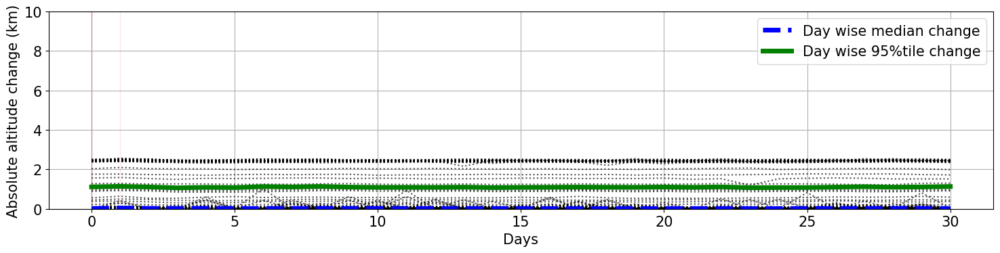

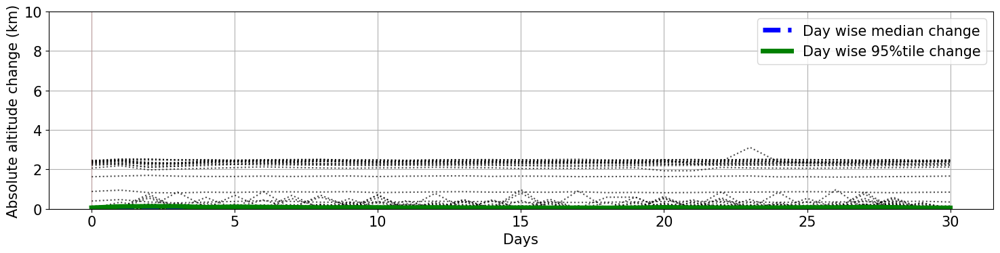

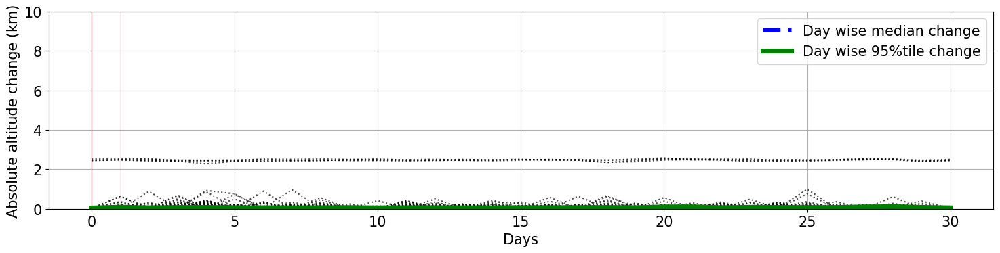

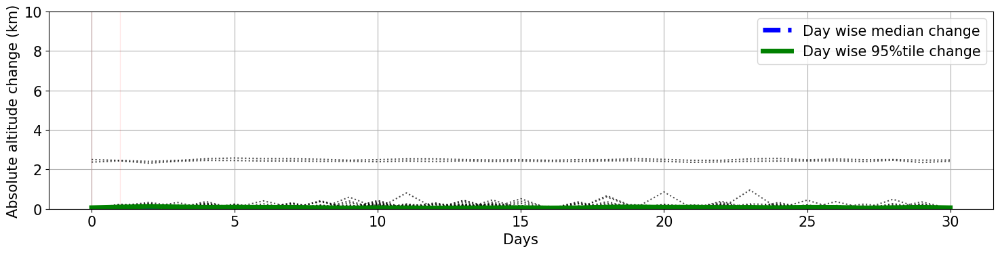

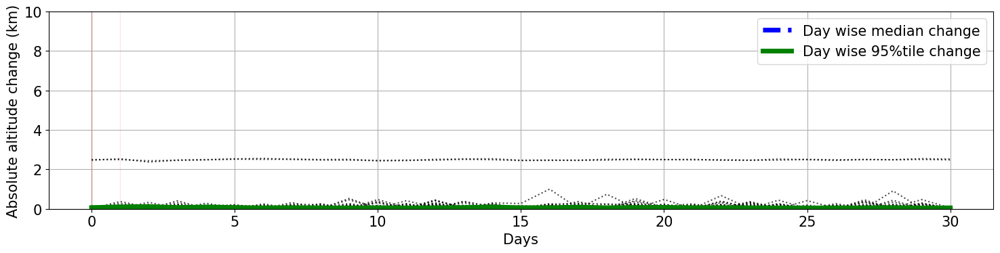

...

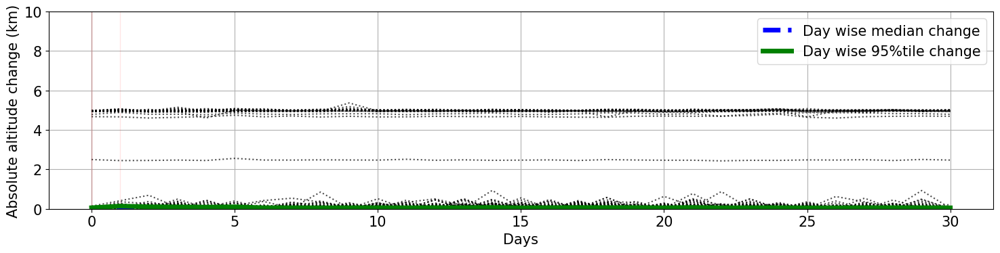

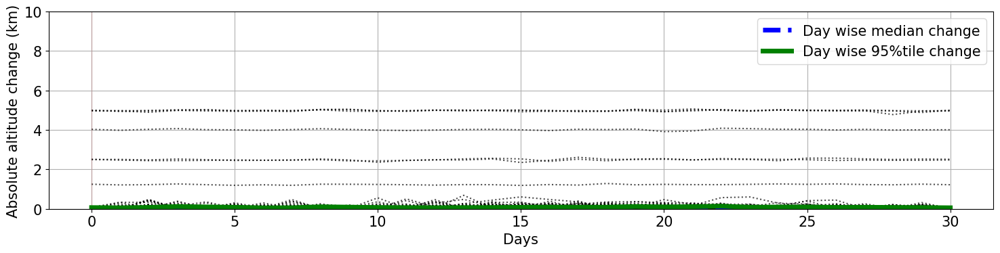

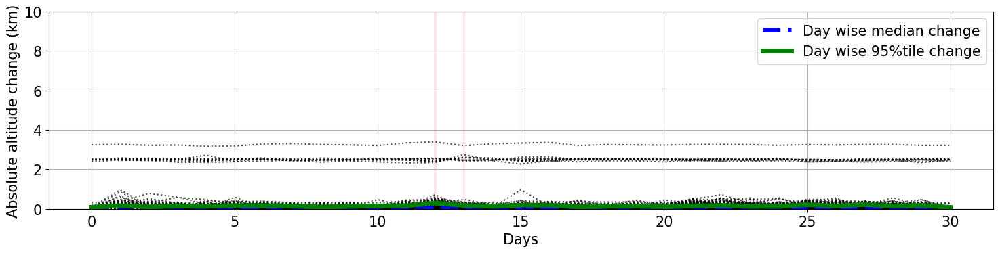

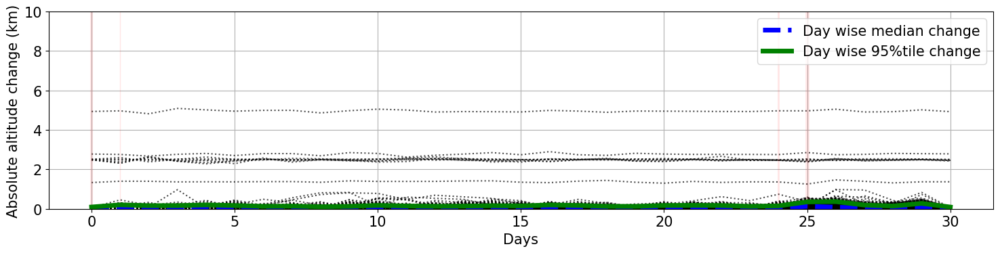

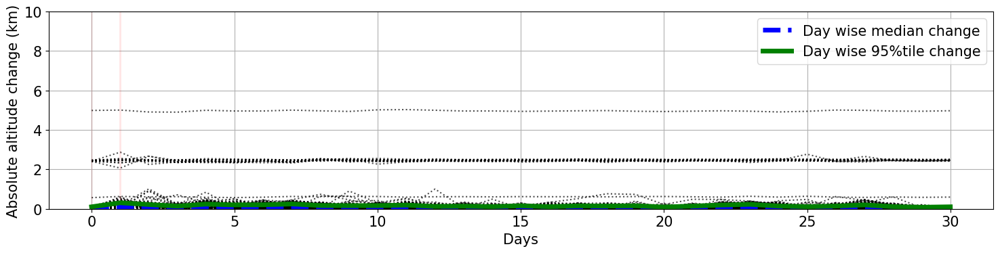

KeyboardInterrupt: 

In [33]:
for file in sorted(os.listdir(MINOR_NO_IMPACT)):
    plot_altitude_variations(
        f"{MINOR_NO_IMPACT}/{file}",
        file.split(".")[0]
    )

### STATION KEEPING

Condition: `START` < `MEDIAN` AND `MEDIAN` > `END`

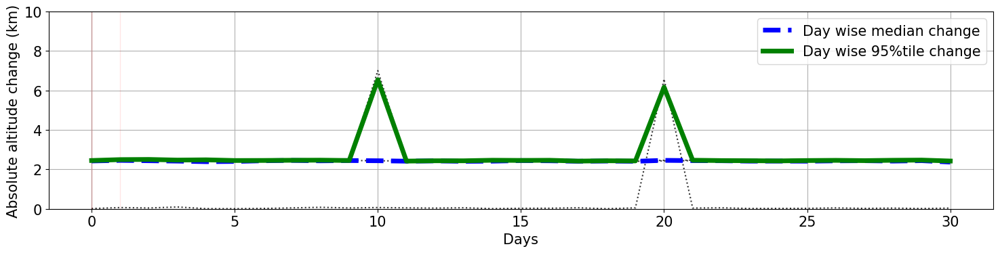

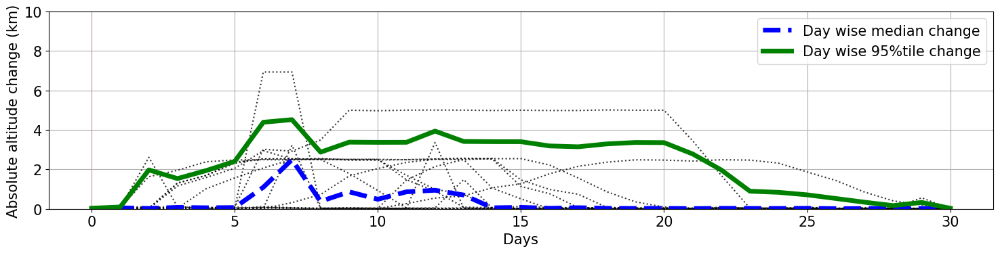

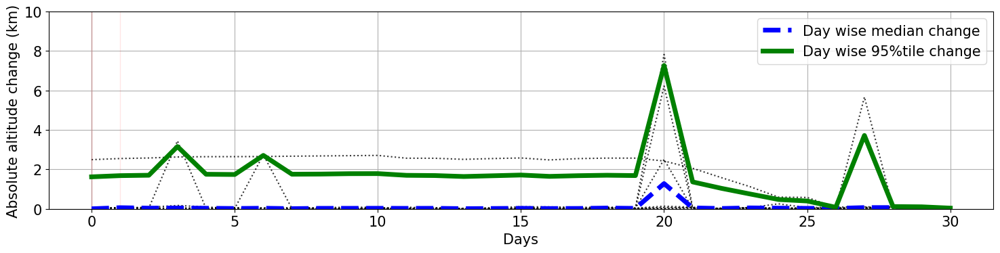

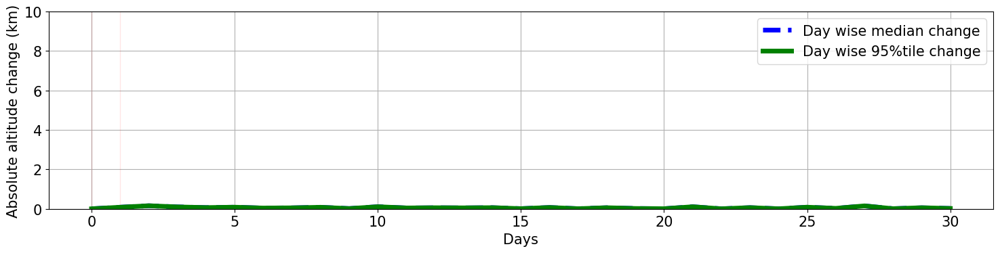

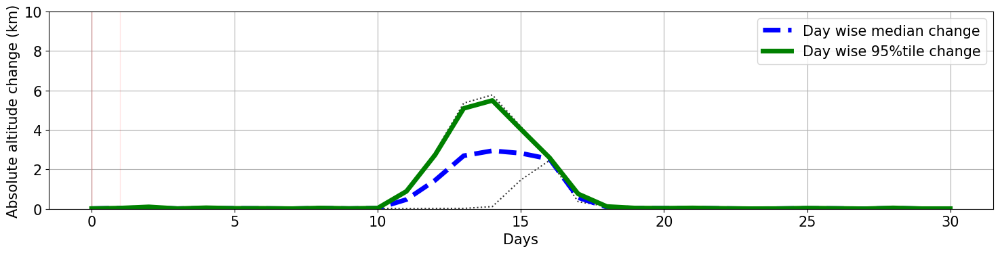

...

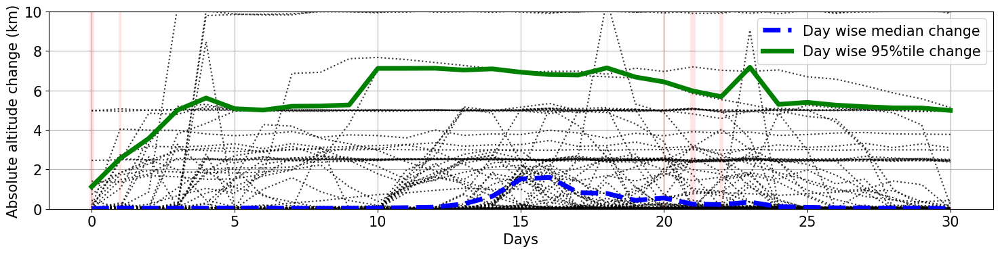

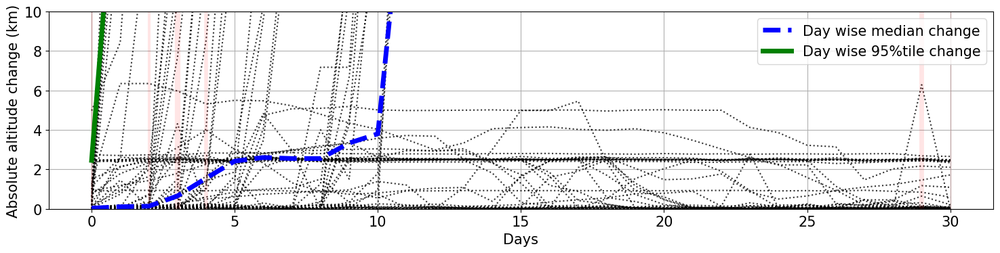

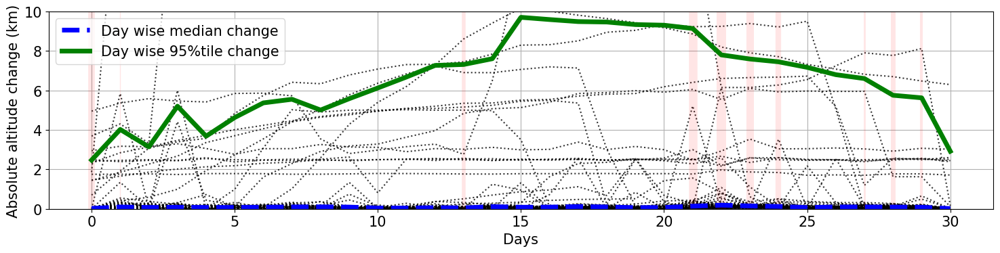

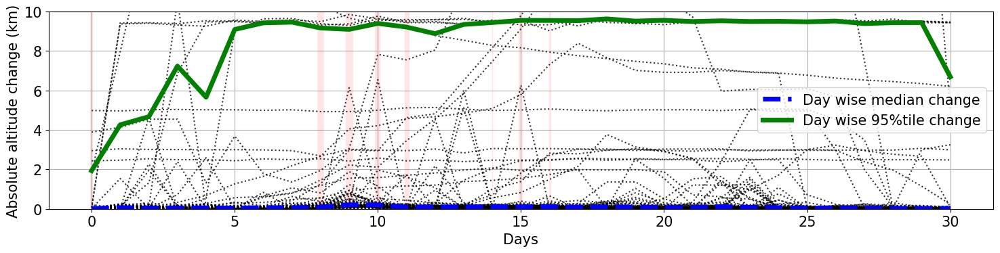

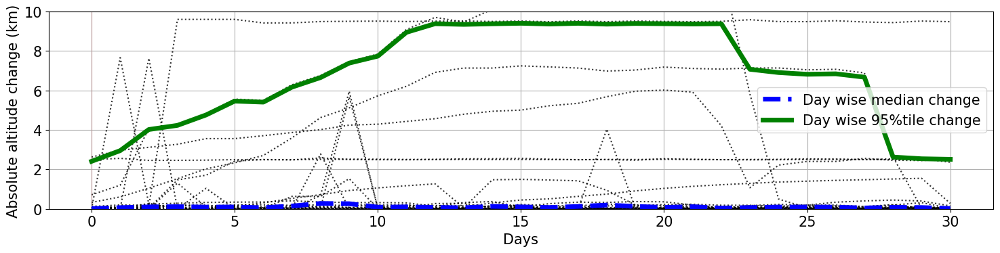

In [25]:
for file in sorted(os.listdir(STATION_KEEPING)):
    plot_altitude_variations(
        f"{STATION_KEEPING}/{file}",
        file.split(".")[0]
    )

### PERMANENT DECAY

Condition: (`MEDIAN` - `START`) > `50`m   AND   (`LAST` - `MEDIAN`) > `50`m

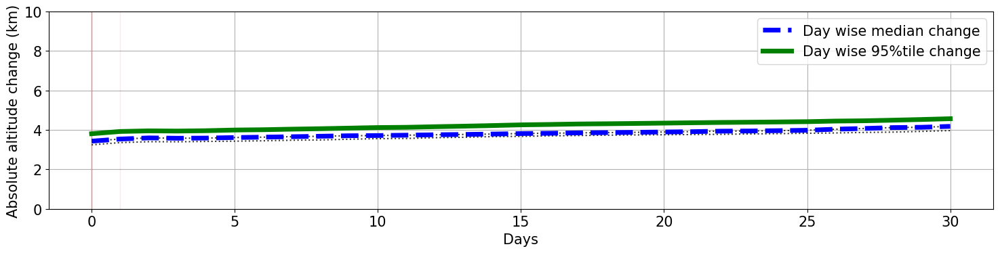

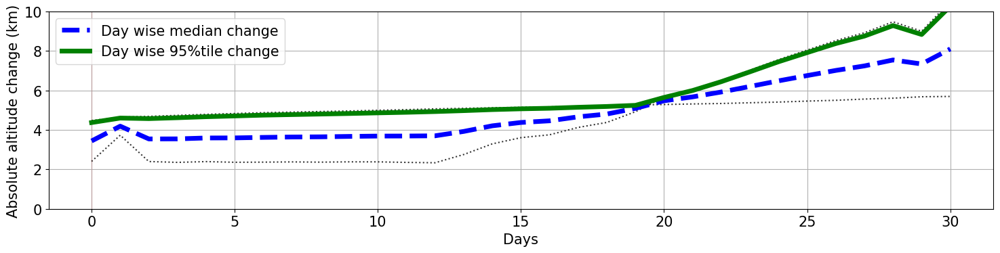

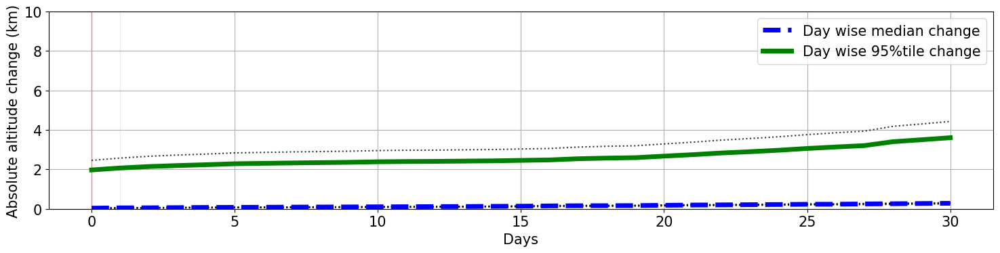

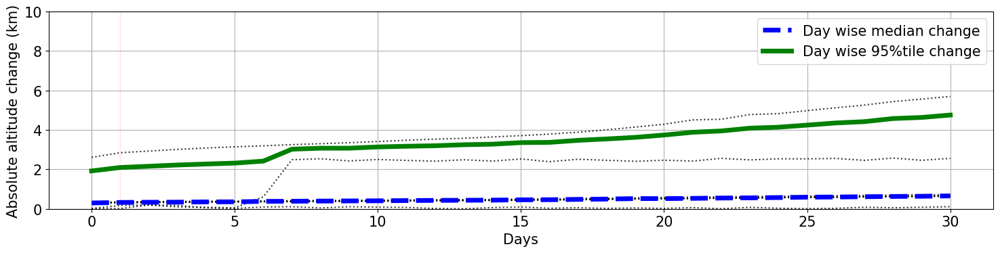

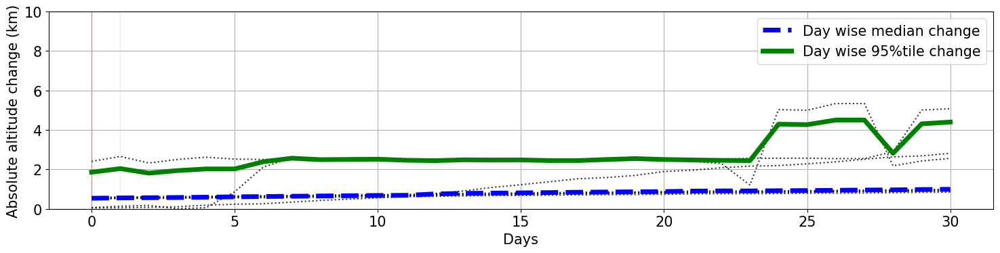

...

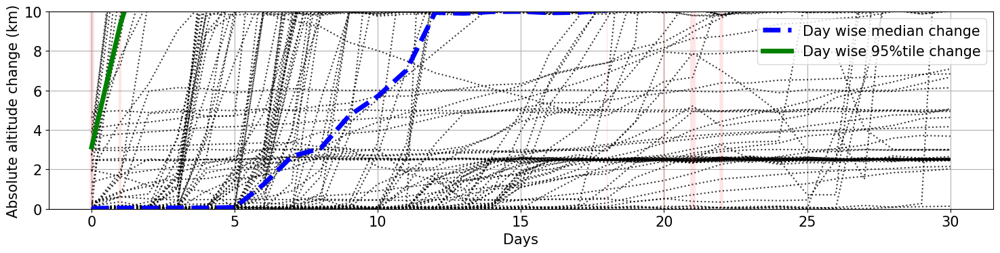

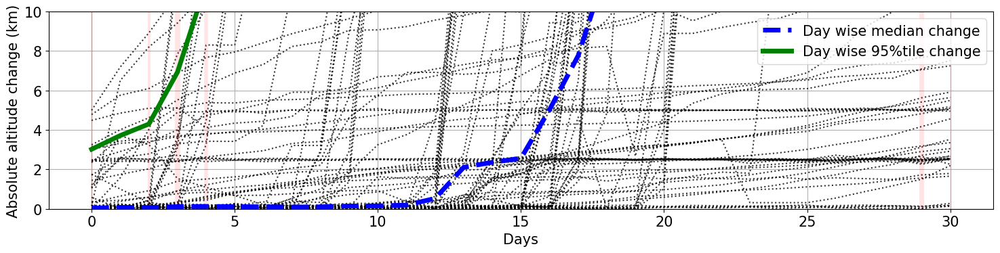

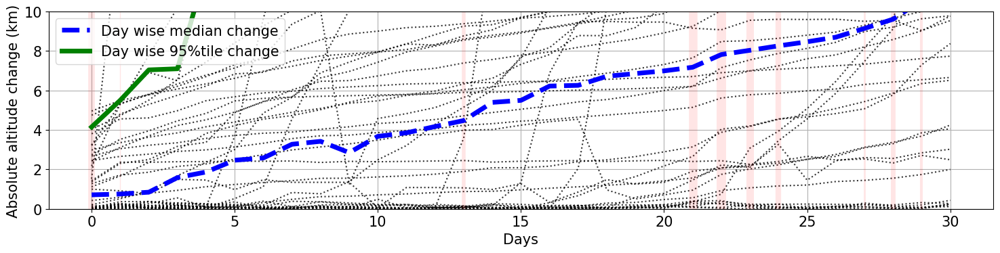

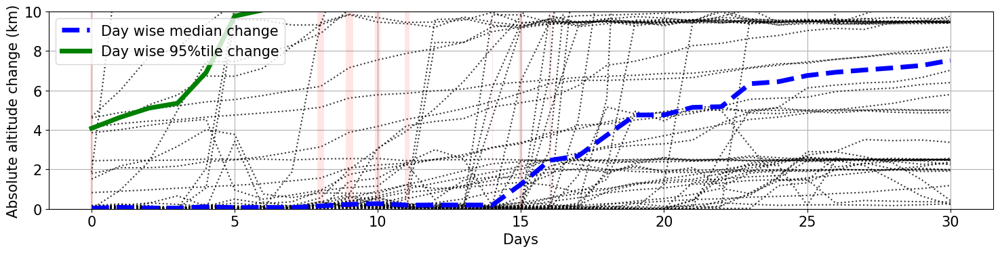

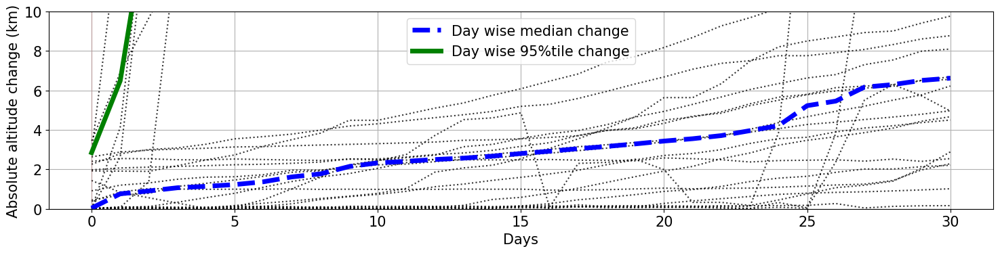

In [26]:
for file in sorted(os.listdir(PERMANENT_DECAY)):
    plot_altitude_variations(
        f"{PERMANENT_DECAY}/{file}",
        file.split(".")[0]
    )

### UNDECIDABLE

These do not fall in either of above conditions

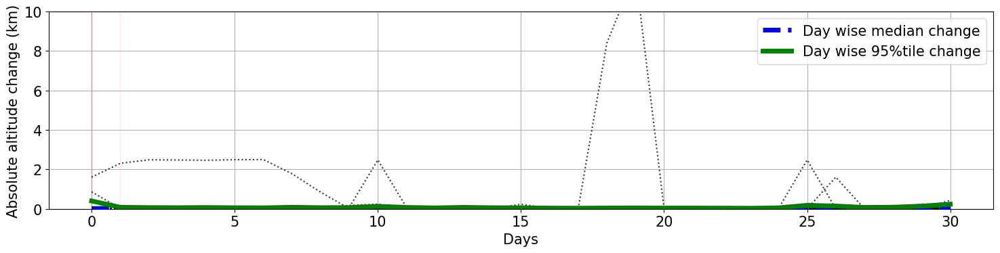

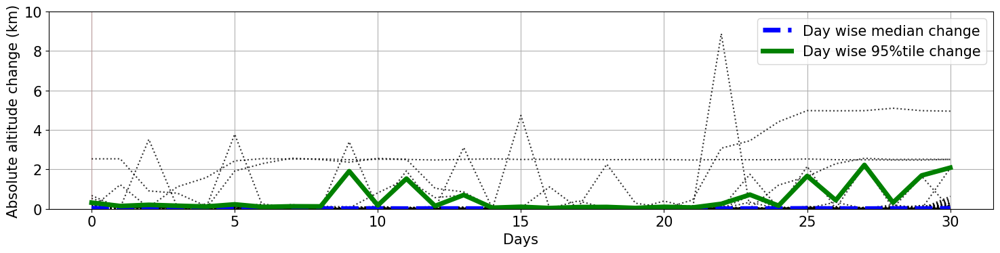

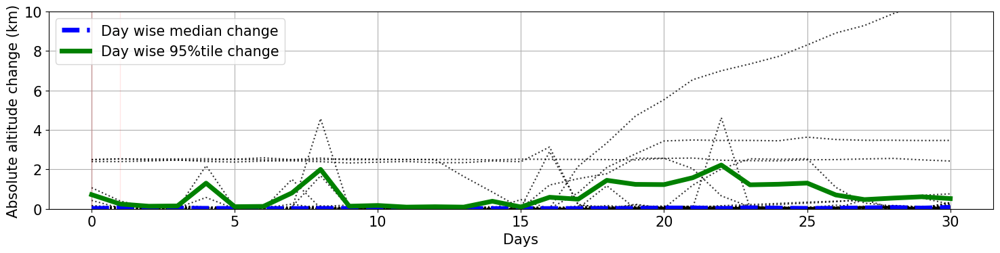

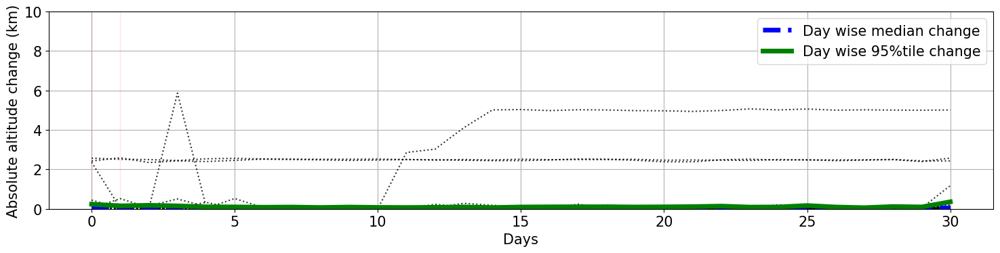

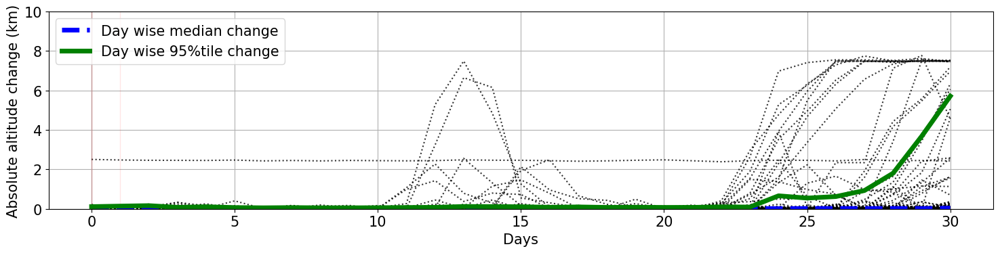

...

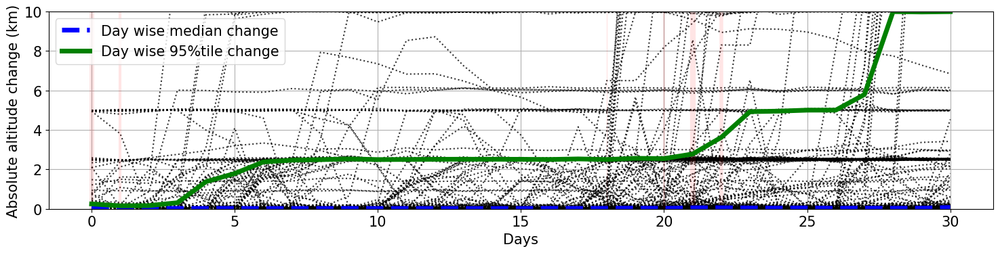

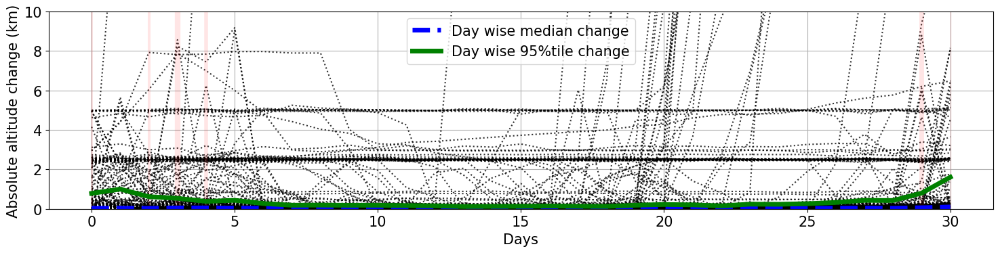

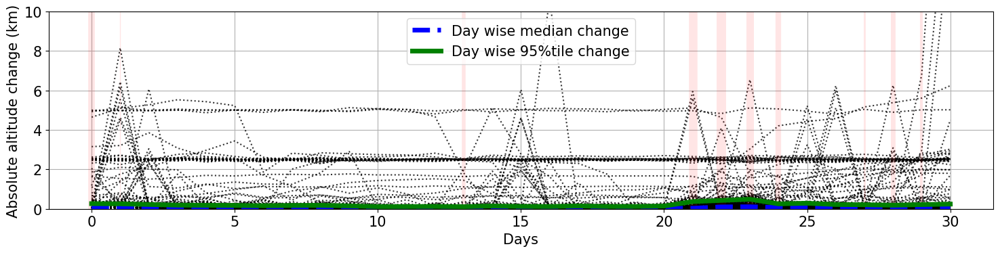

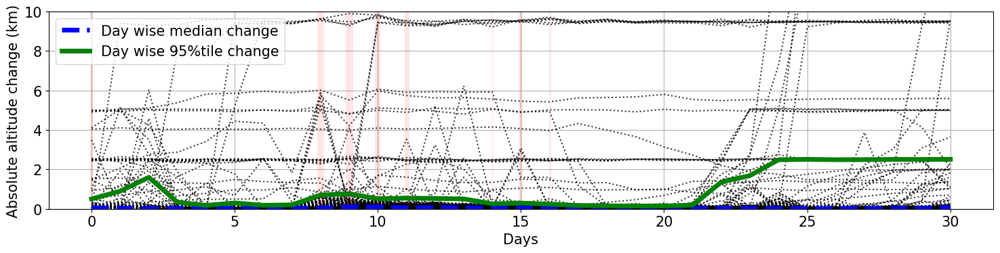

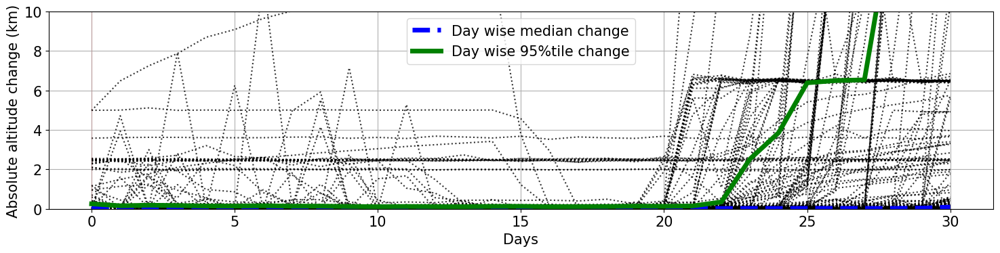

In [27]:
for file in sorted(os.listdir(UNDECIDABLE)):
    plot_altitude_variations(
        f"{UNDECIDABLE}/{file}",
        file.split(".")[0]
    )